# Problem Definition 

 > On April 15, 1912, during her maiden voyage, the widely considered “unsinkable” RMS Titanic sank after colliding with an iceberg. Unfortunately, there weren’t enough lifeboats for everyone onboard, resulting in the death of 1502 out of 2224 passengers and crew.
While there was some element of luck involved in surviving, it seems some groups of people were more likely to survive than others.
In this challenge, I try to build a predictive model that answers the question: “what sorts of people were more likely to survive?” using passenger data (ie name, age, gender, socio-economic class, etc). 

# Data 
 > Data is available on Kaggle: https://www.kaggle.com/competitions/titanic/data

# Features
This is the information about each of the features in data:
 -  survived: Survival
         0 = No
         1 = Yes
 -  pclass: Ticket class
         1 = 1st
         2 = 2nd
         3 = 3rd
 -  sex: Sex
 -  age: Age in years
 -  sibsp: # of siblings / spouses aboard the Titanic
 -  parch: # of parents / children aboard the Titanic
 -  ticket: Ticket number
 -  fare: Passenger fare
 -  cabin: Cabin number
 -  embarked: Port of Embarkation
         C = Cherbourg
         Q = Queenstown
         S = Southampton

# Preparing the tools

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

## Model Evaluations:

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import plot_roc_curve
from sklearn import metrics

## Models from Scikit-Learn:

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import catboost as cb


# Load the Data

In [2]:
df = pd.read_csv("titanic_kaggle_train.csv")
df.shape

(891, 12)

# Data Exploration (Exploratory data analysis or EDA) and Feature Engineering

### At the firts stage we get information about our data:
 -  Do we have missing data?
 -  All data is numerical or we have also categorical data?
 -  Do we have some features that we do not need for our prediction?
 -  Do we need to change some features?

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [4]:
df.head(10)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,NaN,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,NaN,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,NaN,C


In [5]:
# Missing data?
df.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [6]:
# Find the type of our data
df.dtypes

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

# Dealing with Missing Data
I fill the missing data as following:
 -  age: with the median
 -  cabin: with U as unknown
 -  embarked: with U as unknown
    
Before I fill the missing data, I divided data in train and validation sets as well as X and Y.

 > X is the dataframe of all features which help model to predict the target.
 
 > Y is the target and in our case target is "survived"

### Split data

In [7]:
# Split data into x and y

X = df.drop("Survived", axis=1)
y = df.Survived

In [8]:
# Split data into train and test

np.random.seed(42) # to be able to produce same results again

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.1)

### Filling missing data

In [9]:
X_train["Age"].fillna(X_train["Age"].median(), inplace = True)
X_val["Age"].fillna(X_val["Age"].median(), inplace = True)

In [10]:
X_train["Cabin"].fillna('U', inplace = True)
X_val["Cabin"].fillna('U', inplace = True)

In [11]:
X_train["Embarked"].fillna('U', inplace = True)
X_val["Embarked"].fillna('U', inplace = True)

In [12]:
# Check for missing data in train set

X_train.isna().sum()

PassengerId    0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

In [13]:
# Check for missing data in validation set

X_val.isna().sum()

PassengerId    0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

In [14]:
# Remove the columns that we do not need in our prediction: 
# we do not need the name of passengers, ID of them and the number of their tickets.

X_train = X_train.drop(columns={'Name','PassengerId','Ticket'})
X_val = X_val.drop(columns={'Name','PassengerId','Ticket'})

# Change categorical data to numerical data

We have three categorical features that need to change to numerical: Sex, Embarked and Cabin.

 - Sex:
 
    male = 0
    
    female = 1
    
    
 - Embarked:
 
    'C' = 0
    
    'Q' = 1
    
    'S' = 2
    
    'U' = 3
    
    
 - Cabin: letters in cabin numbers
 
    'A' = 0 
    
    'B' = 1
    
    'C' = 2
    
    'D' = 3
    
    'E' = 4
    
    'F' = 5
    
    'G' = 6
    
    'T' = 7
    
    'U' = 8

In [15]:
# Change 'sex' to numerical
X_train['Sex']=X_train['Sex'].map({'male':0,  'female':1})
X_val['Sex']=X_val['Sex'].map({'male':0,  'female':1})

# Change "Embarked" to numerical
X_train['Embarked']=X_train['Embarked'].map({'C':0,  'Q':1, 'S':2, 'U':3})
X_val['Embarked']=X_val['Embarked'].map({'C':0,  'Q':1, 'S':2, 'U':3})

In [16]:
# Check which letters we have in "Cabin" as cabin names in training data set
X_train["Cabin"].unique()

array(['U', 'D50', 'C126', 'D', 'B49', 'E63', 'A31', 'C92', 'E25', 'C95',
       'A5', 'D15', 'D7', 'D17', 'B86', 'A20', 'B78', 'B30', 'D21',
       'D10 D12', 'G6', 'C124', 'B58 B60', 'B38', 'C52', 'C93', 'C45',
       'B20', 'B96 B98', 'C82', 'C78', 'C106', 'C22 C26',
       'B57 B59 B63 B66', 'B28', 'C104', 'F2', 'D11', 'C86', 'E38', 'A34',
       'C91', 'C68', 'F G73', 'E46', 'E50', 'A32', 'C128', 'E10', 'E44',
       'B41', 'B18', 'D35', 'E31', 'C2', 'C50', 'C103', 'B3', 'A10',
       'C49', 'C90', 'B77', 'C123', 'D36', 'E33', 'B5', 'A19', 'B37',
       'E58', 'C23 C25 C27', 'F33', 'C7', 'E67', 'E8', 'B22', 'B35',
       'C125', 'C65', 'C54', 'B80', 'B94', 'D26', 'E121', 'E24', 'D45',
       'B101', 'B51 B53 B55', 'D46', 'E17', 'B4', 'C46', 'A23', 'F4',
       'C47', 'E101', 'C111', 'C101', 'B82 B84', 'C70', 'C32', 'B102',
       'D20', 'B71', 'A36', 'D9', 'B50', 'D33', 'A16', 'B19', 'E12',
       'C83', 'A26', 'F E69', 'A24', 'B73', 'C30', 'E40', 'D30', 'B42',
       'C99', 'C85'

In [17]:
# Check which letters we have in "Cabin" as cabin names in validation data set
X_val["Cabin"].unique()

array(['U', 'D47', 'C123', 'D28', 'D19', 'C110', 'A6', 'D48', 'B69',
       'B96 B98', 'E68', 'B58 B60', 'E77', 'D20', 'B57 B59 B63 B66',
       'C148', 'E49', 'B39', 'F33', 'E34', 'A7', 'D36', 'E36'],
      dtype=object)

In [18]:
# Change 'Cabin' to numerical in training set
X_train["Cabin"] = X_train["Cabin"].str[0]
X_train['Cabin']=X_train['Cabin'].map({'A':0, 'B':1, 'C':2, 'D':3, 'E':4, 'F':5, 'G':6, 'T':7, 'U':8})

# Change 'Cabin' to numerical in validation set
X_val["Cabin"] = X_val["Cabin"].str[0]
X_val['Cabin']=X_val['Cabin'].map({'A':0, 'B':1, 'C':2, 'D':3, 'E':4, 'F':5, 'G':6, 'T':7, 'U':8})

In [19]:
# Check our training set
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 801 entries, 165 to 102
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Pclass    801 non-null    int64  
 1   Sex       801 non-null    int64  
 2   Age       801 non-null    float64
 3   SibSp     801 non-null    int64  
 4   Parch     801 non-null    int64  
 5   Fare      801 non-null    float64
 6   Cabin     801 non-null    int64  
 7   Embarked  801 non-null    int64  
dtypes: float64(2), int64(6)
memory usage: 56.3 KB


In [20]:
# chaeck our validation set
X_val.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 709 to 250
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Pclass    90 non-null     int64  
 1   Sex       90 non-null     int64  
 2   Age       90 non-null     float64
 3   SibSp     90 non-null     int64  
 4   Parch     90 non-null     int64  
 5   Fare      90 non-null     float64
 6   Cabin     90 non-null     int64  
 7   Embarked  90 non-null     int64  
dtypes: float64(2), int64(6)
memory usage: 6.3 KB


In [21]:
# Check our target in training data set
y_train.info()

<class 'pandas.core.series.Series'>
Int64Index: 801 entries, 165 to 102
Series name: Survived
Non-Null Count  Dtype
--------------  -----
801 non-null    int64
dtypes: int64(1)
memory usage: 12.5 KB


In [22]:
# Check our target in validation data set
y_val.info()

<class 'pandas.core.series.Series'>
Int64Index: 90 entries, 709 to 250
Series name: Survived
Non-Null Count  Dtype
--------------  -----
90 non-null     int64
dtypes: int64(1)
memory usage: 1.4 KB


# Explore our Data 

 > We can look at correlation between our features and target as well as visualize them.

In [23]:
# Make the dataframe with our features and target in training data set
df_train = X_train.copy()
df_train ['Survived'] = y_train
df_train

,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked,Survived
165,3,0,9.0,0,2,20.5250,8,2,1
541,3,1,9.0,4,2,31.2750,8,2,0
625,1,0,61.0,0,0,32.3208,3,2,0
388,3,0,28.0,0,0,7.7292,8,1,0
76,3,0,28.0,0,0,7.8958,8,2,0
...,...,...,...,...,...,...,...,...,...
106,3,1,21.0,0,0,7.6500,8,2,1
270,1,0,28.0,0,0,31.0000,8,2,0
860,3,0,41.0,2,0,14.1083,8,2,0
435,1,1,14.0,1,2,120.0000,1,2,1


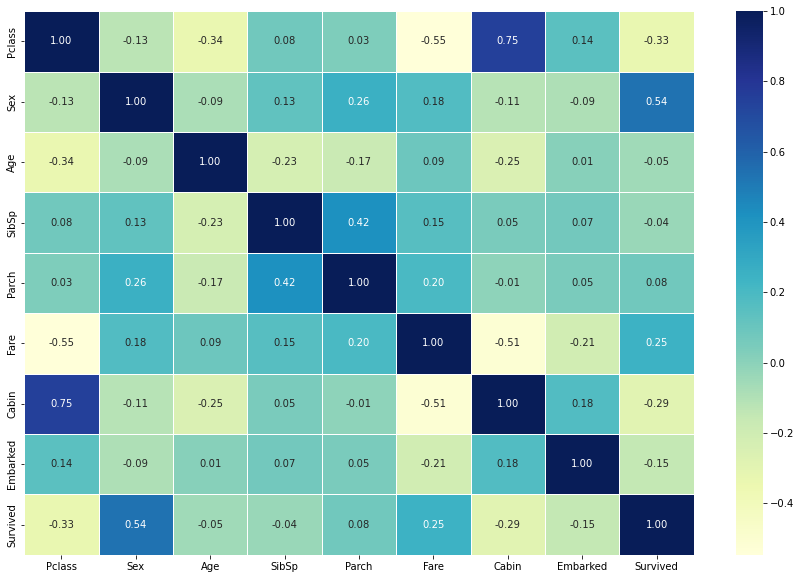

In [24]:
# show the correlation matrix 
corr_matrix = df_train.corr()
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");

'Sex' column has the most correlation with our target. Then comes the class of tickets as "Pclass".
Therefore I show them with bar graph too.

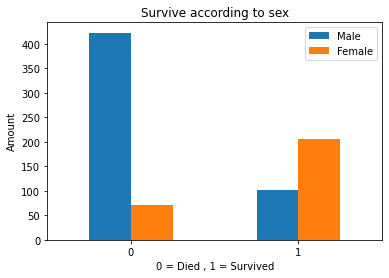

In [25]:
# Show the survival according to the "sex"

df_y_train = pd.DataFrame (y_train)
pd.crosstab(df_y_train["Survived"] ,  X_train["Sex"] ).plot (kind = "bar");

plt.title("Survive according to sex")
plt.xlabel("0 = Died , 1 = Survived")
plt.ylabel("Amount")
plt.legend(["Male", "Female"])
plt.xticks(rotation=0);

In [26]:
pd.crosstab(X_train["Sex"], df_y_train["Survived"])

Survived,0,1
Sex,,
0,423,101
1,72,205


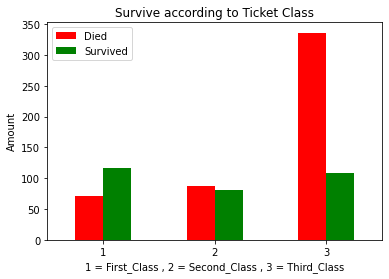

In [27]:
# Show the survival according to the Class of the tickets

df_y_train = pd.DataFrame (y_train)
pd.crosstab( X_train["Pclass"] , df_y_train["Survived"] ).plot (kind = "bar" , color = ['red', 'green'])

plt.title("Survive according to Ticket Class")
plt.xlabel("1 = First_Class , 2 = Second_Class , 3 = Third_Class")
plt.ylabel("Amount")
plt.legend(["Died", "Survived"])
plt.xticks(rotation=0);

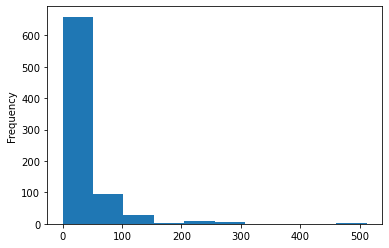

In [28]:
# Check the distribution of ticket price with histogram

df_train["Fare"].plot.hist();

# Modeling

 > Now our data is ready and we know that our problem is binary classification. It is time to choose models and fit our training data with the models. I use these four models which are famous for classification problems and I compare the accuracy of them.
 
 - Logistic Regression
 - KNeighbors Classifier
 - RandomForest Classifier
 - CatBoost Classifier

In [29]:
# Our models 
models = {"Logistic Regression": LogisticRegression(max_iter=3000),
          "KNN": KNeighborsClassifier(),
          "Random Forest": RandomForestClassifier(),
          "Cat Boost" : cb.CatBoostClassifier()}


# Create a function to fit and score models
def fit_score(models, X_train, X_val, y_train, y_val):
    np.random.seed(42)
    model_scores = {}
    for name, model in models.items():
        model.fit(X_train, y_train)
        model_scores[name] = model.score(X_val, y_val)
    return model_scores

In [30]:
# Fit our models and compare the accuracy of them
model_scores = fit_score(models=models,
                             X_train=X_train,
                             X_val=X_val,
                             y_train=y_train,
                             y_val=y_val)

model_scores

Learning rate set to 0.009371
0:	learn: 0.6896544	total: 170ms	remaining: 2m 50s
1:	learn: 0.6850920	total: 173ms	remaining: 1m 26s
2:	learn: 0.6796129	total: 175ms	remaining: 58.2s
3:	learn: 0.6742785	total: 179ms	remaining: 44.6s
4:	learn: 0.6688825	total: 182ms	remaining: 36.2s
5:	learn: 0.6634568	total: 186ms	remaining: 30.8s
6:	learn: 0.6573791	total: 189ms	remaining: 26.8s
7:	learn: 0.6522094	total: 193ms	remaining: 23.9s
8:	learn: 0.6469593	total: 198ms	remaining: 21.8s
9:	learn: 0.6416419	total: 203ms	remaining: 20.1s
10:	learn: 0.6365540	total: 206ms	remaining: 18.6s
11:	learn: 0.6309739	total: 210ms	remaining: 17.3s
12:	learn: 0.6265718	total: 219ms	remaining: 16.6s
13:	learn: 0.6224754	total: 221ms	remaining: 15.6s
14:	learn: 0.6179954	total: 225ms	remaining: 14.8s
15:	learn: 0.6132032	total: 229ms	remaining: 14.1s
16:	learn: 0.6087798	total: 232ms	remaining: 13.4s
17:	learn: 0.6048510	total: 235ms	remaining: 12.8s
18:	learn: 0.6013403	total: 238ms	remaining: 12.3s
19:	learn

{'Logistic Regression': 0.8555555555555555,
 'KNN': 0.7888888888888889,
 'Random Forest': 0.8333333333333334,
 'Cat Boost': 0.8444444444444444}

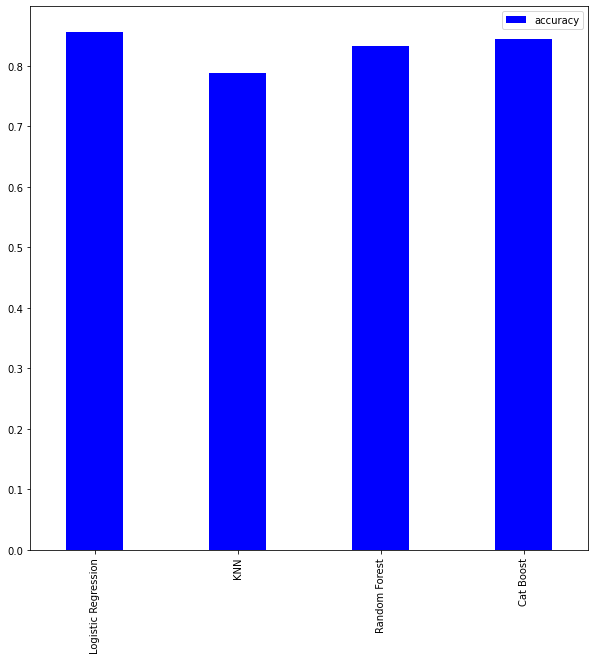

In [61]:
# visualization the differences between acuuracies
model_compare = pd.DataFrame(model_scores, index=["accuracy"])
model_compare.T.plot.bar(color = 'b', width = 0.4, figsize=(10,10) );

# Hyperparameters tuning

In [48]:
# Create a hyperparameter grid for CatBoost

cat_grid = {'learning_rate': [0.01,0.03,0.05,0.1],
'depth': [4,5,7,8,10],
'l2_leaf_reg': [1, 3, 5],
'iterations': [20,30,50,80,100,150]}


# Create a hyperparameter grid for LogisticRegression

log_reg_grid = {"C": np.logspace(-4, 4, 20),
                "solver": ['newton-cg', 'lbfgs', 'liblinear'],
               'penalty' : ['l1','l2']}


# Create a hyperparameter grid for RandomForestClassifier

rf_grid = {"n_estimators": np.arange(10, 1000, 50),
           "max_depth": [None, 3, 5, 10],
           "min_samples_split": np.arange(2, 20, 2),
           "min_samples_leaf": np.arange(1, 20, 2)}

# Tune CatBoostClassifier with cross-validation (CV) method

In [55]:
# Setup grid hyperparameter search for CatBoostClassifier

gs_cat = GridSearchCV(cb.CatBoostClassifier(),
                          param_grid=cat_grid,
                          cv=10,
                          verbose=True)


# Fit grid hyperparameter search model
gs_cat.fit(X_train, y_train);

Fitting 10 folds for each of 360 candidates, totalling 3600 fits
0:	learn: 0.6898513	total: 392us	remaining: 7.46ms
1:	learn: 0.6857454	total: 1.09ms	remaining: 9.84ms
2:	learn: 0.6817986	total: 1.79ms	remaining: 10.2ms
3:	learn: 0.6776989	total: 2.23ms	remaining: 8.91ms
4:	learn: 0.6741668	total: 4.19ms	remaining: 12.6ms
5:	learn: 0.6706626	total: 5.12ms	remaining: 12ms
6:	learn: 0.6669319	total: 5.95ms	remaining: 11ms
7:	learn: 0.6635576	total: 6.65ms	remaining: 9.97ms
8:	learn: 0.6605870	total: 7.42ms	remaining: 9.07ms
9:	learn: 0.6570297	total: 8.16ms	remaining: 8.16ms
10:	learn: 0.6531844	total: 8.98ms	remaining: 7.35ms
11:	learn: 0.6504306	total: 9.65ms	remaining: 6.44ms
12:	learn: 0.6470655	total: 10.5ms	remaining: 5.67ms
13:	learn: 0.6433559	total: 11.3ms	remaining: 4.84ms
14:	learn: 0.6397153	total: 12.1ms	remaining: 4.04ms
15:	learn: 0.6367589	total: 13.2ms	remaining: 3.31ms
16:	learn: 0.6335492	total: 14ms	remaining: 2.48ms
17:	learn: 0.6303424	total: 15.2ms	remaining: 1.69m

In [56]:
# Find the best parameters
gs_cat.best_params_

{'depth': 7, 'iterations': 80, 'l2_leaf_reg': 3, 'learning_rate': 0.1}

In [57]:
# Score the model with the best parameters
gs_cat.score(X_val, y_val)

0.8444444444444444

# Tune RandomForestClassifier with CV method

In [58]:
# Setup randomized hyperparameter search for RandomForestClassifier
rs_rf = RandomizedSearchCV(RandomForestClassifier(), 
                           param_distributions=rf_grid,
                           cv=10,
                           n_iter=50,
                           verbose=True)


# Fit randomized hyperparameter search model
rs_rf.fit(X_train, y_train)                                   

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(), n_iter=50,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([ 10,  60, 110, 160, 210, 260, 310, 360, 410, 460, 510, 560, 610,
       660, 710, 760, 810, 860, 910, 960])},
                   verbose=True)

In [59]:
# Find the best parameters
rs_rf.best_params_

{'n_estimators': 360,
 'min_samples_split': 8,
 'min_samples_leaf': 3,
 'max_depth': 5}

In [60]:
# Score the model with the best parameters
rs_rf.score (X_val , y_val)

0.8444444444444444

# Tune LogisticRegression with CV method

In [52]:

# Setup grid hyperparameter search for LogisticRegression

gs_log_reg = GridSearchCV(LogisticRegression(),
                          param_grid=log_reg_grid,
                          cv=10,
                          verbose=True)


# Fit grid hyperparameter search model
gs_log_reg.fit(X_train, y_train);

Fitting 10 folds for each of 120 candidates, totalling 1200 fits


In [53]:
# Find the best parameters
gs_log_reg.best_params_

{'C': 0.615848211066026, 'penalty': 'l2', 'solver': 'liblinear'}

In [54]:
# Score the model with the best parameters
gs_log_reg.score(X_val, y_val)

0.8555555555555555

# Tune KNN with changing the numbers of neighbors

In [66]:
# tune KNN

train_scores = []
test_scores = []

neighbors = range(1, 30)


knn = KNeighborsClassifier()


for i in neighbors:
    knn.set_params(n_neighbors=i)
    
    knn.fit(X_train, y_train)
    
    train_scores.append(knn.score(X_train, y_train))
    
    test_scores.append(knn.score(X_val, y_val))

In [67]:
train_scores

[0.9762796504369539,
 0.8302122347066168,
 0.83645443196005,
 0.8064918851435705,
 0.8027465667915106,
 0.7802746566791511,
 0.7777777777777778,
 0.762796504369538,
 0.766541822721598,
 0.7565543071161048,
 0.7515605493133583,
 0.7440699126092385,
 0.7503121098626716,
 0.7403245942571786,
 0.7453183520599251,
 0.735330836454432,
 0.7340823970037453,
 0.731585518102372,
 0.735330836454432,
 0.731585518102372,
 0.7278401997503121,
 0.7215980024968789,
 0.7203495630461922,
 0.7128589263420724,
 0.7203495630461922,
 0.7091136079900124,
 0.7166042446941323,
 0.7153558052434457,
 0.7203495630461922]

In [68]:
test_scores

[0.6888888888888889,
 0.7111111111111111,
 0.7888888888888889,
 0.7555555555555555,
 0.7888888888888889,
 0.7777777777777778,
 0.7777777777777778,
 0.7333333333333333,
 0.7444444444444445,
 0.7111111111111111,
 0.7555555555555555,
 0.7444444444444445,
 0.7666666666666667,
 0.7777777777777778,
 0.7777777777777778,
 0.7888888888888889,
 0.7888888888888889,
 0.7888888888888889,
 0.7888888888888889,
 0.7888888888888889,
 0.7888888888888889,
 0.7777777777777778,
 0.7777777777777778,
 0.7222222222222222,
 0.7333333333333333,
 0.7333333333333333,
 0.7333333333333333,
 0.7333333333333333,
 0.7333333333333333]

Maximum KNN score on the test data: 78.89%


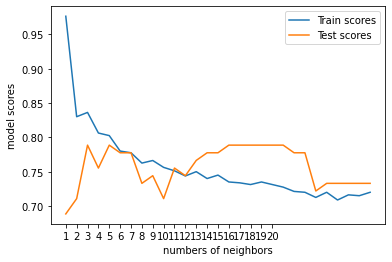

In [69]:
# Show the trend of training scores and test scores as well as the maximum of the score in test set

plt.plot(neighbors, train_scores, label = "Train scores")
plt.plot(neighbors, test_scores, label = "Test scores")

plt.xticks(np.arange(1, 21, 1))

plt.legend()
plt.xlabel("numbers of neighbors")
plt.ylabel("model scores")

print(f"Maximum KNN score on the test data: {max(test_scores)*100:.2f}%")

# Which Model?
 > As we can see after tuning our models the "Logistic Regression" model shows the best accuracy with 85.55% 

# Evaluting our tuned machine learning classifier, beyond accuracy

 - ROC curve and AUC score

 - Confusion matrix

 - Classification report

 - Precision

 - Recall

 - F1-score



In [78]:
# Make predictions with tuned model
y_pred = gs_log_reg.predict(X_val)

In [79]:
# Look at our predictions
y_pred

array([0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 0])

In [80]:
# Look at the actual amount of our target 
y_val

709    1
439    0
840    0
720    1
39     1
      ..
493    0
215    1
309    1
822    0
250    0
Name: Survived, Length: 90, dtype: int64

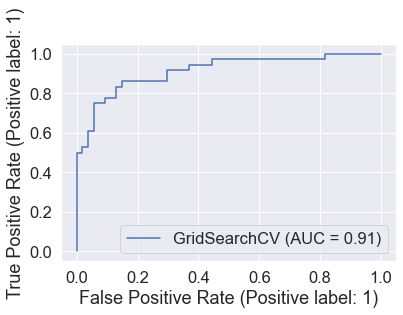

In [82]:
# Plot ROC curve and calculate AUC metric

metrics.plot_roc_curve(gs_log_reg, X_val, y_val);

In [83]:
# Confusion matrix

print(confusion_matrix(y_val, y_pred))

[[46  8]
 [ 5 31]]


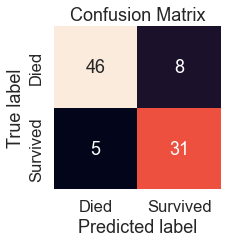

In [84]:
# Plot the confusion matrix

sns.set(font_scale=1.5)

def plot_conf_mat(y_val, y_pred):
    fig, ax = plt.subplots(figsize=(3, 3))
    ax = sns.heatmap(confusion_matrix(y_val, y_pred),
                     annot=True,
                     cbar=False)
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title('Confusion Matrix')
    
    ax.xaxis.set_ticklabels(['Died', 'Survived'])
    ax.yaxis.set_ticklabels(['Died', 'Survived'])
 
plot_conf_mat(y_val, y_pred)

In [85]:
# Classification report

print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.85      0.88        54
           1       0.79      0.86      0.83        36

    accuracy                           0.86        90
   macro avg       0.85      0.86      0.85        90
weighted avg       0.86      0.86      0.86        90



# Feature Importance

 > which features contributed most to the outcomes of the model and how did they contribute?

In [88]:
# Make a model with best parameters
clf = LogisticRegression(C = 0.615848211066026, penalty = 'l2', solver = 'liblinear')

clf.fit(X_train, y_train);

In [90]:
# Check coef_

clf.coef_

array([[-0.73375033,  2.53369834, -0.02554287, -0.30140696, -0.07620572,
         0.00309327, -0.05616682, -0.13291052]])

In [92]:
# Match coef's of features to columns

feature_dict = dict(zip(df_train.columns, list(clf.coef_[0])))
feature_dict

{'Pclass': -0.733750330280339,
 'Sex': 2.533698344948901,
 'Age': -0.025542870757129892,
 'SibSp': -0.3014069645911241,
 'Parch': -0.07620572354132704,
 'Fare': 0.003093269516608312,
 'Cabin': -0.0561668150578749,
 'Embarked': -0.1329105189418744}

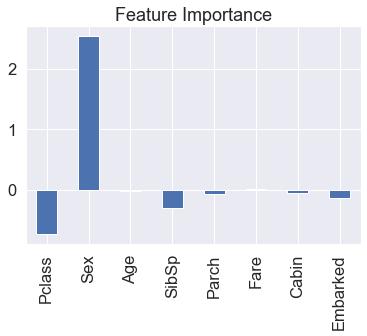

In [93]:
# Visualize feature importance

feature_df = pd.DataFrame(feature_dict, index=[0])
feature_df.T.plot.bar(title="Feature Importance", legend=False);